In [ ]:
# prompt: mount drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# List all files in /content/
print("Files in /content/:")
for filename in os.listdir('/content/'):
    print(filename)


Files in /content/:
.config
drive
BD dtaset.zip
sample_data


In [ ]:
# Unzip the file into the /content/ directory
!unzip '/content/BD dtaset.zip' -d '/content/'


Archive:  /content/BD dtaset.zip
   creating: /content/BD dtaset/
   creating: /content/BD dtaset/Testing/
  inflating: /content/BD dtaset/Testing/testing_labels.csv  
   creating: /content/BD dtaset/Testing/testing_words/
  inflating: /content/BD dtaset/Testing/testing_words/0.png  
  inflating: /content/BD dtaset/Testing/testing_words/1.png  
  inflating: /content/BD dtaset/Testing/testing_words/10.png  
  inflating: /content/BD dtaset/Testing/testing_words/100.png  
  inflating: /content/BD dtaset/Testing/testing_words/101.png  
  inflating: /content/BD dtaset/Testing/testing_words/102.png  
  inflating: /content/BD dtaset/Testing/testing_words/103.png  
  inflating: /content/BD dtaset/Testing/testing_words/104.png  
  inflating: /content/BD dtaset/Testing/testing_words/105.png  
  inflating: /content/BD dtaset/Testing/testing_words/106.png  
  inflating: /content/BD dtaset/Testing/testing_words/107.png  
  inflating: /content/BD dtaset/Testing/testing_words/108.png  
  inflating: /

Sample of Selected Training Images:


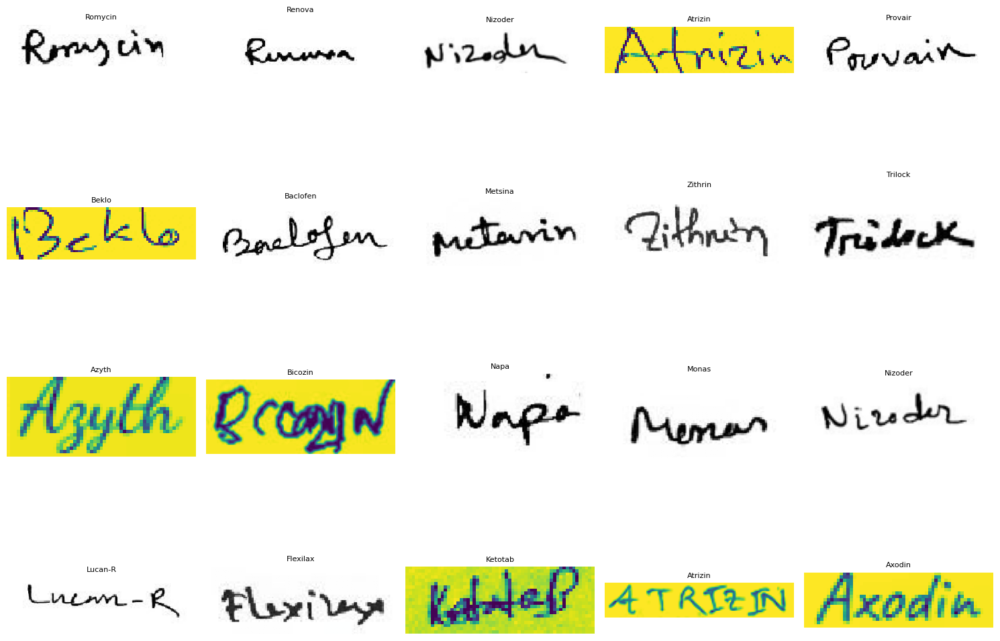

In [ ]:
import os
import random
import pandas as pd
import shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Base directory
base_dir = '/content/BD dtaset/'

# Paths to image directories
train_img_dir = os.path.join(base_dir, 'Training', 'training_words')
val_img_dir = os.path.join(base_dir, 'Validation', 'validation_words')
test_img_dir = os.path.join(base_dir, 'Testing', 'testing_words')

# Paths to labels CSV files
train_labels_path = os.path.join(base_dir, 'Training', 'training_labels.csv')
val_labels_path = os.path.join(base_dir, 'Validation', 'validation_labels.csv')
test_labels_path = os.path.join(base_dir, 'Testing', 'testing_labels.csv')

# Read the training labels CSV file
train_labels = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Select 100 correct images
# Option 1: Random selection
if len(train_labels) < 100:
    print(f"Only {len(train_labels)} images available in training set.")
    selected_train_labels = train_labels.copy()
else:
    # Randomly select 100 images
    selected_train_labels = train_labels.sample(n=100, random_state=42).reset_index(drop=True)

# Optionally, create a directory to store selected images
selected_train_dir = '/content/selected_training_images'
os.makedirs(selected_train_dir, exist_ok=True)

# Copy selected images to the new directory
for img_name in selected_train_labels['IMAGE']:
    src = os.path.join(train_img_dir, img_name)
    dst = os.path.join(selected_train_dir, img_name)
    if os.path.exists(src):
        shutil.copy(src, dst)
    else:
        print(f"Image not found and cannot be copied: {src}")

def visualize_images(labels_df, img_dir, num_images=20):
    # Get the list of image file names from the labels DataFrame
    image_files = labels_df['IMAGE'].tolist()

    # Check if there are enough images
    if len(image_files) == 0:
        print(f"No images found in {img_dir}")
        return
    elif len(image_files) < num_images:
        print(f"Only {len(image_files)} images found in {img_dir}. Displaying all of them.")
        num_images = len(image_files)

    # Randomly select images
    selected_images = random.sample(image_files, num_images)

    # Determine grid size
    cols = 5
    rows = (num_images // cols) + int(num_images % cols > 0)

    # Set the figure size
    plt.figure(figsize=(15, 3 * rows))

    # Loop through the selected images and display them
    for i, img_name in enumerate(selected_images):
        img_path = os.path.join(img_dir, img_name)
        if os.path.exists(img_path):
            img = mpimg.imread(img_path)
            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            plt.axis('off')
            # Get the label (MEDICINE_NAME)
            label = labels_df.loc[labels_df['IMAGE'] == img_name, 'MEDICINE_NAME'].values[0]
            plt.title(label, fontsize=8)
        else:
            print(f"Image not found: {img_path}")
    plt.tight_layout()
    plt.show()

print("Sample of Selected Training Images:")
visualize_images(selected_train_labels, selected_train_dir, num_images=20)


In [ ]:
import os
import random
import numpy as np
import pandas as pd
import shutil
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import History
import tensorflow as tf


Step 2: Prepare the Dataset

In [ ]:
# Base directory
base_dir = '/content/BD dtaset/'

# Training images directory (selected 100 images)
selected_train_dir = '/content/selected_training_images'

# Original test and validation directories
test_img_dir = os.path.join(base_dir, 'Testing', 'testing_words')
val_img_dir = os.path.join(base_dir, 'Validation', 'validation_words')

# Paths to labels CSV files
train_labels_path = os.path.join(base_dir, 'Training', 'training_labels.csv')
test_labels_path = os.path.join(base_dir, 'Testing', 'testing_labels.csv')
val_labels_path = os.path.join(base_dir, 'Validation', 'validation_labels.csv')


Load Labels

In [ ]:
# Load labels
train_labels = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
test_labels = pd.read_csv(test_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
val_labels = pd.read_csv(val_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])


 Prepare Training Data

In [ ]:
# If selected_train_labels is not defined, select 100 images
selected_train_labels = train_labels.sample(n=100, random_state=42).reset_index(drop=True)

# Copy selected images to a separate directory
selected_train_dir = '/content/selected_training_images'
os.makedirs(selected_train_dir, exist_ok=True)

for img_name in selected_train_labels['IMAGE']:
    src = os.path.join(base_dir, 'Training', 'training_words', img_name)
    dst = os.path.join(selected_train_dir, img_name)
    if os.path.exists(src):
        shutil.copy(src, dst)
    else:
        print(f"Image not found and cannot be copied: {src}")


Prepare Test and Validation Data

In [ ]:
# Select 30 images from test set
if len(test_labels) < 30:
    print(f"Only {len(test_labels)} images available in test set.")
    selected_test_labels = test_labels.copy()
else:
    selected_test_labels = test_labels.sample(n=30, random_state=42).reset_index(drop=True)

# Copy selected test images to a separate directory
selected_test_dir = '/content/selected_test_images'
os.makedirs(selected_test_dir, exist_ok=True)

for img_name in selected_test_labels['IMAGE']:
    src = os.path.join(test_img_dir, img_name)
    dst = os.path.join(selected_test_dir, img_name)
    if os.path.exists(src):
        shutil.copy(src, dst)
    else:
        print(f"Image not found and cannot be copied: {src}")

# Select 30 images from validation set
if len(val_labels) < 30:
    print(f"Only {len(val_labels)} images available in validation set.")
    selected_val_labels = val_labels.copy()
else:
    selected_val_labels = val_labels.sample(n=30, random_state=42).reset_index(drop=True)

# Copy selected validation images to a separate directory
selected_val_dir = '/content/selected_validation_images'
os.makedirs(selected_val_dir, exist_ok=True)

for img_name in selected_val_labels['IMAGE']:
    src = os.path.join(val_img_dir, img_name)
    dst = os.path.join(selected_val_dir, img_name)
    if os.path.exists(src):
        shutil.copy(src, dst)
    else:
        print(f"Image not found and cannot be copied: {src}")


Prepare DataFrames for Generators

In [ ]:
# Training DataFrame
train_df = selected_train_labels.copy()
train_df['filename'] = train_df['IMAGE']
train_df['class'] = train_df['MEDICINE_NAME']
train_df = train_df[['filename', 'class']]

# Test DataFrame
test_df = selected_test_labels.copy()
test_df['filename'] = test_df['IMAGE']
test_df['class'] = test_df['MEDICINE_NAME']
test_df = test_df[['filename', 'class']]

# Validation DataFrame
val_df = selected_val_labels.copy()
val_df['filename'] = val_df['IMAGE']
val_df['class'] = val_df['MEDICINE_NAME']
val_df = val_df[['filename', 'class']]


Create ImageDataGenerators

In [ ]:
# Create ImageDataGenerators
train_datagen = ImageDataGenerator(rescale=1./255)  # You can add augmentation here
test_datagen = ImageDataGenerator(rescale=1./255)

# Training Generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=selected_train_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

# Validation Generator
validation_generator = test_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=selected_val_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

# Test Generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=selected_test_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Found 100 validated image filenames belonging to 58 classes.
Found 30 validated image filenames belonging to 26 classes.
Found 30 validated image filenames belonging to 26 classes.


Define the CNN Model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

# Number of classes
num_classes = len(train_generator.class_indices)

# Load the MobileNetV2 model without the top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with additional metrics
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy', 'mse', 'mae'])


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
#identify common classes
# Classes in training data
train_classes = set(train_df['class'].unique())

# Classes in validation data
val_classes = set(val_df['class'].unique())

# Classes in test data
test_classes = set(test_df['class'].unique())

# Find common classes
common_classes = train_classes & val_classes & test_classes

print(f"Number of common classes: {len(common_classes)}")
print("Common classes:", sorted(common_classes))


Number of common classes: 21
Common classes: ['Alatrol', 'Amodis', 'Azithrocin', 'Azyth', 'Backtone', 'Bicozin', 'Conaz', 'Disopan', 'Exium', 'Flexilax', 'Ketocon', 'Ketotab', 'Lumona', 'Napa Extend', 'Nidazyl', 'Nizoder', 'Progut', 'Provair', 'Rozith', 'Tridosil', 'Zithrin']


In [ ]:
#filter training data
filtered_train_df = train_df[train_df['class'].isin(common_classes)].reset_index(drop=True)


In [ ]:
#filter validation data
filtered_val_df = val_df[val_df['class'].isin(common_classes)].reset_index(drop=True)


In [ ]:
#filter test data
filtered_test_df = test_df[test_df['class'].isin(common_classes)].reset_index(drop=True)


In [ ]:
#update class names and number of classes
# Update class names based on common classes
class_names = sorted(common_classes)
num_classes = len(class_names)
print(f"Total number of classes after filtering: {num_classes}")
print("Class names:", class_names)


Total number of classes after filtering: 21
Class names: ['Alatrol', 'Amodis', 'Azithrocin', 'Azyth', 'Backtone', 'Bicozin', 'Conaz', 'Disopan', 'Exium', 'Flexilax', 'Ketocon', 'Ketotab', 'Lumona', 'Napa Extend', 'Nidazyl', 'Nizoder', 'Progut', 'Provair', 'Rozith', 'Tridosil', 'Zithrin']


Step 4: Update Data Generators
4.1 Training Generator

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=filtered_train_df,
    directory=selected_train_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Use common classes
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)


Found 34 validated image filenames belonging to 21 classes.


In [ ]:
# validation generators
validation_generator = test_datagen.flow_from_dataframe(
    dataframe=filtered_val_df,
    directory=selected_val_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Use common classes
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Found 24 validated image filenames belonging to 21 classes.


In [ ]:
#test generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=filtered_test_df,
    directory=selected_test_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Use common classes
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Found 24 validated image filenames belonging to 21 classes.


In [ ]:
# verify class indices
print("Training Generator Class Indices:")
print(train_generator.class_indices)

print("Validation Generator Class Indices:")
print(validation_generator.class_indices)

print("Test Generator Class Indices:")
print(test_generator.class_indices)


Training Generator Class Indices:
{'Alatrol': 0, 'Amodis': 1, 'Azithrocin': 2, 'Azyth': 3, 'Backtone': 4, 'Bicozin': 5, 'Conaz': 6, 'Disopan': 7, 'Exium': 8, 'Flexilax': 9, 'Ketocon': 10, 'Ketotab': 11, 'Lumona': 12, 'Napa Extend': 13, 'Nidazyl': 14, 'Nizoder': 15, 'Progut': 16, 'Provair': 17, 'Rozith': 18, 'Tridosil': 19, 'Zithrin': 20}
Validation Generator Class Indices:
{'Alatrol': 0, 'Amodis': 1, 'Azithrocin': 2, 'Azyth': 3, 'Backtone': 4, 'Bicozin': 5, 'Conaz': 6, 'Disopan': 7, 'Exium': 8, 'Flexilax': 9, 'Ketocon': 10, 'Ketotab': 11, 'Lumona': 12, 'Napa Extend': 13, 'Nidazyl': 14, 'Nizoder': 15, 'Progut': 16, 'Provair': 17, 'Rozith': 18, 'Tridosil': 19, 'Zithrin': 20}
Test Generator Class Indices:
{'Alatrol': 0, 'Amodis': 1, 'Azithrocin': 2, 'Azyth': 3, 'Backtone': 4, 'Bicozin': 5, 'Conaz': 6, 'Disopan': 7, 'Exium': 8, 'Flexilax': 9, 'Ketocon': 10, 'Ketotab': 11, 'Lumona': 12, 'Napa Extend': 13, 'Nidazyl': 14, 'Nizoder': 15, 'Progut': 16, 'Provair': 17, 'Rozith': 18, 'Tridosil': 1

In [ ]:
#update model definition
# Number of classes
num_classes = len(class_names)
print(f"Number of classes in the model: {num_classes}")


Number of classes in the model: 21


In [ ]:
#define model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

# Load the MobileNetV2 model without the top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with additional metrics
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


verify class weight

In [ ]:
from sklearn.utils import class_weight
import numpy as np

# Ensure that 'filtered_train_df' exists and contains the training data
print(f"Number of samples in filtered training data: {len(filtered_train_df)}")

# Get the classes from 'class_indices' to ensure consistency
class_indices = train_generator.class_indices
class_labels = list(class_indices.keys())
class_indices_inv = {v: k for k, v in class_indices.items()}  # Inverse mapping

# Map class names to class indices in 'filtered_train_df'
filtered_train_df['class_index'] = filtered_train_df['class'].map(class_indices)

# Verify mapping
print("Class mapping in training data:")
print(filtered_train_df[['class', 'class_index']].drop_duplicates())

# Compute class weights using class indices
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(filtered_train_df['class_index']),
    y=filtered_train_df['class_index']
)

# Map class weights to class indices
class_weight_dict = {i: class_weights_array[i] for i in range(len(class_weights_array))}

# Verify class_weight_dict
print("Computed class weights:")
print(class_weight_dict)


Number of samples in filtered training data: 34
Class mapping in training data:
          class  class_index
0      Tridosil           19
1   Napa Extend           13
2       Disopan            7
3      Flexilax            9
4        Progut           16
5       Alatrol            0
6       Nizoder           15
7       Provair           17
8         Exium            8
9    Azithrocin            2
10      Nidazyl           14
11      Ketotab           11
12     Backtone            4
13      Zithrin           20
14       Amodis            1
17      Bicozin            5
18        Azyth            3
20        Conaz            6
21       Lumona           12
23       Rozith           18
25      Ketocon           10
Computed class weights:
{0: 1.619047619047619, 1: 0.8095238095238095, 2: 0.8095238095238095, 3: 1.619047619047619, 4: 1.619047619047619, 5: 0.8095238095238095, 6: 1.619047619047619, 7: 1.619047619047619, 8: 1.619047619047619, 9: 1.619047619047619, 10: 1.619047619047619, 11: 0.53968

In [ ]:
# Get the class indices from train_generator
class_indices = train_generator.class_indices
print("Class indices from train_generator:")
print(class_indices)


Class indices from train_generator:
{'Alatrol': 0, 'Amodis': 1, 'Azithrocin': 2, 'Azyth': 3, 'Backtone': 4, 'Bicozin': 5, 'Conaz': 6, 'Disopan': 7, 'Exium': 8, 'Flexilax': 9, 'Ketocon': 10, 'Ketotab': 11, 'Lumona': 12, 'Napa Extend': 13, 'Nidazyl': 14, 'Nizoder': 15, 'Progut': 16, 'Provair': 17, 'Rozith': 18, 'Tridosil': 19, 'Zithrin': 20}


In [ ]:
# Map class names to class indices in 'filtered_train_df'
filtered_train_df['class_index'] = filtered_train_df['class'].map(class_indices)

# Ensure 'class_index' is of integer type
filtered_train_df['class_index'] = filtered_train_df['class_index'].astype(int)

# Verify mapping
print("Class mapping in training data:")
print(filtered_train_df[['class', 'class_index']].drop_duplicates())


Class mapping in training data:
          class  class_index
0      Tridosil           19
1   Napa Extend           13
2       Disopan            7
3      Flexilax            9
4        Progut           16
5       Alatrol            0
6       Nizoder           15
7       Provair           17
8         Exium            8
9    Azithrocin            2
10      Nidazyl           14
11      Ketotab           11
12     Backtone            4
13      Zithrin           20
14       Amodis            1
17      Bicozin            5
18        Azyth            3
20        Conaz            6
21       Lumona           12
23       Rozith           18
25      Ketocon           10


In [ ]:
from sklearn.utils import class_weight
import numpy as np

# Get the unique class indices present in the training data
unique_class_indices = np.unique(filtered_train_df['class_index'])

# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=unique_class_indices,
    y=filtered_train_df['class_index']
)


In [ ]:
# Map class weights to class indices
class_weight_dict = {class_index: weight for class_index, weight in zip(unique_class_indices, class_weights_array)}

# Verify 'class_weight_dict'
print("Computed class weights:")
print(class_weight_dict)


Computed class weights:
{0: 1.619047619047619, 1: 0.8095238095238095, 2: 0.8095238095238095, 3: 1.619047619047619, 4: 1.619047619047619, 5: 0.8095238095238095, 6: 1.619047619047619, 7: 1.619047619047619, 8: 1.619047619047619, 9: 1.619047619047619, 10: 1.619047619047619, 11: 0.5396825396825397, 12: 1.619047619047619, 13: 0.40476190476190477, 14: 0.8095238095238095, 15: 0.8095238095238095, 16: 1.619047619047619, 17: 0.40476190476190477, 18: 1.619047619047619, 19: 1.619047619047619, 20: 1.619047619047619}


In [ ]:
print("Type of 'class_weight_dict':", type(class_weight_dict))
print("Contents of 'class_weight_dict':", class_weight_dict)


Type of 'class_weight_dict': <class 'dict'>
Contents of 'class_weight_dict': {0: 1.619047619047619, 1: 0.8095238095238095, 2: 0.8095238095238095, 3: 1.619047619047619, 4: 1.619047619047619, 5: 0.8095238095238095, 6: 1.619047619047619, 7: 1.619047619047619, 8: 1.619047619047619, 9: 1.619047619047619, 10: 1.619047619047619, 11: 0.5396825396825397, 12: 1.619047619047619, 13: 0.40476190476190477, 14: 0.8095238095238095, 15: 0.8095238095238095, 16: 1.619047619047619, 17: 0.40476190476190477, 18: 1.619047619047619, 19: 1.619047619047619, 20: 1.619047619047619}


CONSIDER FULL DATASET

In [ ]:
#LOAD LABELS
import pandas as pd

# Paths to labels CSV files
train_labels_path = '/content/BD dtaset/Training/training_labels.csv'
val_labels_path = '/content/BD dtaset/Validation/validation_labels.csv'
test_labels_path = '/content/BD dtaset/Testing/testing_labels.csv'

# Load labels
train_labels = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
val_labels = pd.read_csv(val_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
test_labels = pd.read_csv(test_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])


In [ ]:
#PREPARE DATASFRAME FOR GENERATORS
# Training DataFrame
train_df = train_labels.copy()
train_df['filename'] = train_df['IMAGE']
train_df['class'] = train_df['MEDICINE_NAME']
train_df = train_df[['filename', 'class']]

# Validation DataFrame
val_df = val_labels.copy()
val_df['filename'] = val_df['IMAGE']
val_df['class'] = val_df['MEDICINE_NAME']
val_df = val_df[['filename', 'class']]

# Test DataFrame
test_df = test_labels.copy()
test_df['filename'] = test_df['IMAGE']
test_df['class'] = test_df['MEDICINE_NAME']
test_df = test_df[['filename', 'class']]


In [ ]:
# DEFINE THE DATA GENERATORS
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define directories
train_dir = '/content/BD dtaset/Training/training_words/'
val_dir = '/content/BD dtaset/Validation/validation_words/'
test_dir = '/content/BD dtaset/Testing/testing_words/'

# Create ImageDataGenerators
train_datagen = ImageDataGenerator(rescale=1./255)  # You can add augmentation here
test_datagen = ImageDataGenerator(rescale=1./255)

# Training Generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

# Validation Generator
validation_generator = test_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=val_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

# Test Generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_dir,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Found 3120 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.


In [ ]:
#ENSURE CONSITENT CLASS ACROSS GENERTORS
# Get the list of classes from the training data
class_names = sorted(train_df['class'].unique())
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Update generators to use the same class list
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

validation_generator = test_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=val_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Number of classes: 78
Found 3120 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.


In [ ]:
#DEFINE AND COMPILE THE MODEL
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

# Load the MobileNetV2 model without the top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


Number of classes: 78
Found 3120 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.
Found 780 validated image filenames belonging to 78 classes.
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


195/195 ━━━━━━━━━━━━━━━━━━━━ 117s 573ms/step - accuracy: 0.1048 - loss: 4.1359 - val_accuracy: 0.2769 - val_loss: 2.9043
Epoch 2/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 134s 533ms/step - accuracy: 0.3478 - loss: 2.5693 - val_accuracy: 0.3795 - val_loss: 2.4457
Epoch 3/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 142s 528ms/step - accuracy: 0.4645 - loss: 2.0192 - val_accuracy: 0.4667 - val_loss: 2.0470
Epoch 4/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 141s 528ms/step - accuracy: 0.5506 - loss: 1.6420 - val_accuracy: 0.4910 - val_loss: 1.9613
Epoch 5/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 146s 547ms/step - accuracy: 0.5759 - loss: 1.4709 - val_accuracy: 0.5423 - val_loss: 1.7654
Epoch 6/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 144s 556ms/step - accuracy: 0.6535 - loss: 1.2942 - val_accuracy: 0.4987 - val_loss: 1.8537
Epoch 7/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 139s 543ms/step - accuracy: 0.6853 - loss: 1.1327 - val_accuracy: 0.5103 - val_loss: 1.9196
Epoch 8/10
195/195 ━━━━━━━━━━━━━━━━━━━━ 108s 551ms/step - accuracy: 0.6970 - loss: 1.09

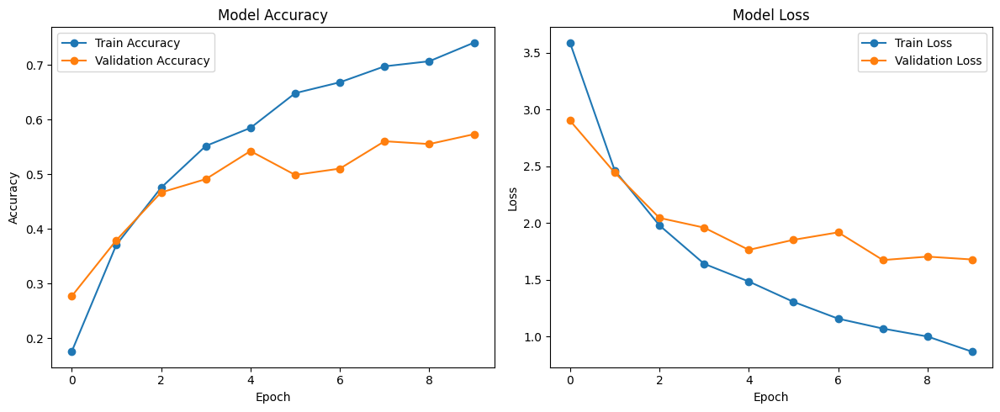

Test Set Predictions:
49/49 ━━━━━━━━━━━━━━━━━━━━ 22s 425ms/step


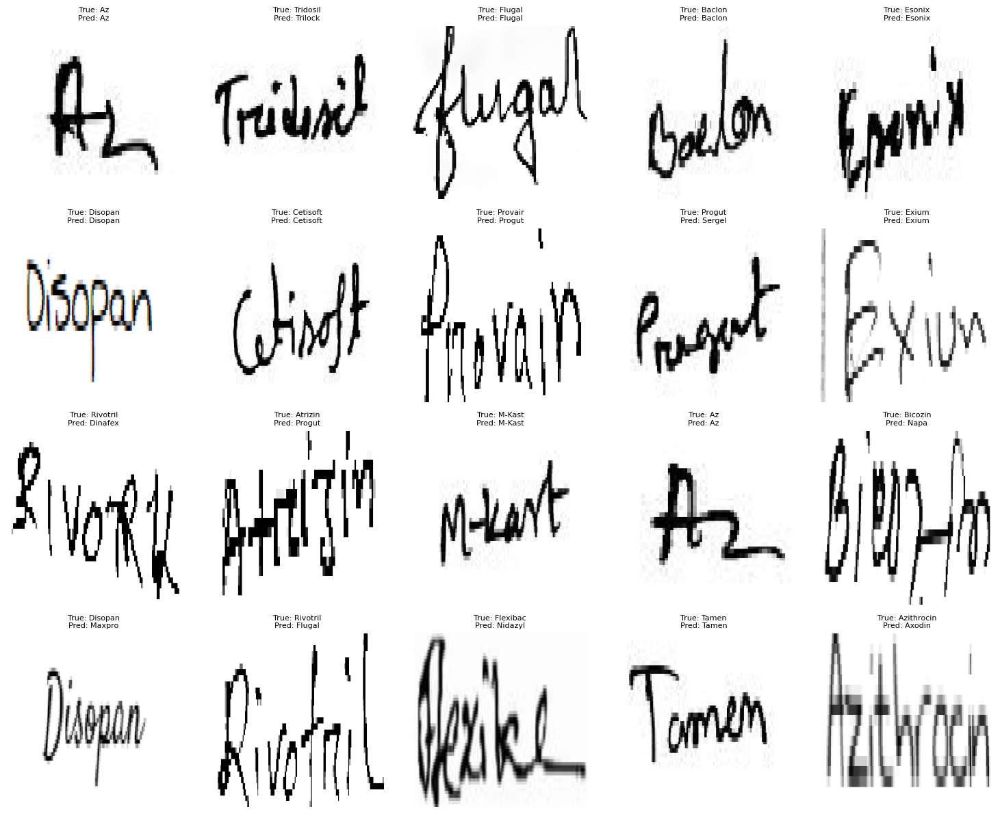

In [ ]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Base directory
base_dir = '/content/BD dtaset/'

# Paths to image directories
train_dir = os.path.join(base_dir, 'Training', 'training_words')
val_dir = os.path.join(base_dir, 'Validation', 'validation_words')
test_dir = os.path.join(base_dir, 'Testing', 'testing_words')

# Paths to labels CSV files
train_labels_path = os.path.join(base_dir, 'Training', 'training_labels.csv')
val_labels_path = os.path.join(base_dir, 'Validation', 'validation_labels.csv')
test_labels_path = os.path.join(base_dir, 'Testing', 'testing_labels.csv')

# Read the labels CSV files
train_labels = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
val_labels = pd.read_csv(val_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])
test_labels = pd.read_csv(test_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Prepare DataFrames for generators
# Training DataFrame
train_df = train_labels.copy()
train_df['filename'] = train_df['IMAGE']
train_df['class'] = train_df['MEDICINE_NAME']
train_df = train_df[['filename', 'class']]

# Validation DataFrame
val_df = val_labels.copy()
val_df['filename'] = val_df['IMAGE']
val_df['class'] = val_df['MEDICINE_NAME']
val_df = val_df[['filename', 'class']]

# Test DataFrame
test_df = test_labels.copy()
test_df['filename'] = test_df['IMAGE']
test_df['class'] = test_df['MEDICINE_NAME']
test_df = test_df[['filename', 'class']]

# Get the list of classes from the training data
class_names = sorted(train_df['class'].unique())
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Create ImageDataGenerators with data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

# For validation and test data, only rescale
test_datagen = ImageDataGenerator(rescale=1./255)

# Training Generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)

# Validation Generator
validation_generator = test_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=val_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

# Test Generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_dir,
    x_col='filename',
    y_col='class',
    classes=class_names,  # Ensuring consistency
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

# Define the model using MobileNetV2
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers on top
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create the complete model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Define EarlyStopping callback to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
epochs = 10

history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Visualize training & validation accuracy and loss
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Function to visualize predictions
def visualize_predictions(generator, model, num_images=20):
    # Reset the generator and get predictions
    generator.reset()
    predictions = model.predict(generator, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())
    filenames = generator.filenames

    # Randomly select images to display
    indices = random.sample(range(len(filenames)), num_images)
    cols = 5
    rows = (num_images // cols) + int(num_images % cols > 0)
    plt.figure(figsize=(15, 3 * rows))

    for i, idx in enumerate(indices):
        img_path = os.path.join(generator.directory, filenames[idx])
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_array)
        plt.axis('off')
        true_label = class_labels[true_classes[idx]]
        predicted_label = class_labels[predicted_classes[idx]]
        plt.title(f"True: {true_label}\nPred: {predicted_label}", fontsize=8)
    plt.tight_layout()
    plt.show()

# Visualize test set predictions
print("Test Set Predictions:")
visualize_predictions(test_generator, model, num_images=20)


In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 2: Define the path to save the model using the .keras extension
model_save_path = '/content/drive/My Drive/MyModels/cnn_transfer.keras'

# Step 3: Save the trained model using the new format
model.save(model_save_path)

print(f"Model saved to {model_save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved to /content/drive/My Drive/MyModels/cnn_transfer.keras


In [ ]:
from tensorflow.keras.models import load_model

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the path where the model is saved
model_load_path = '/content/drive/My Drive/MyModels/cnn_transfer.keras'

# Load the model
model = load_model(model_load_path)

print("Model loaded successfully!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model loaded successfully!


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


transfer learning on GAN

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
CNN model loaded successfully!
Generator model created!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
Saved original image: 900001.png
Saved augmented image: 901001.png
Saved augmented image: 902001.png
Saved augmented image: 903001.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Saved original image: 900002.png
Saved augmented image: 901002.png
Saved augmented image: 902002.png
Saved augmented image: 903002.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
Saved original image: 900003.png
Saved augmented image: 901003.png
Saved augmented image: 902003.png
Saved augmented image: 903003.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
Saved original image: 900004.png
Saved augmented image: 901004.png
Saved augmented image: 902004.png
Saved augmented image: 903004.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Saved original image: 900005.png
Saved augmented image: 901005.png
Saved augment

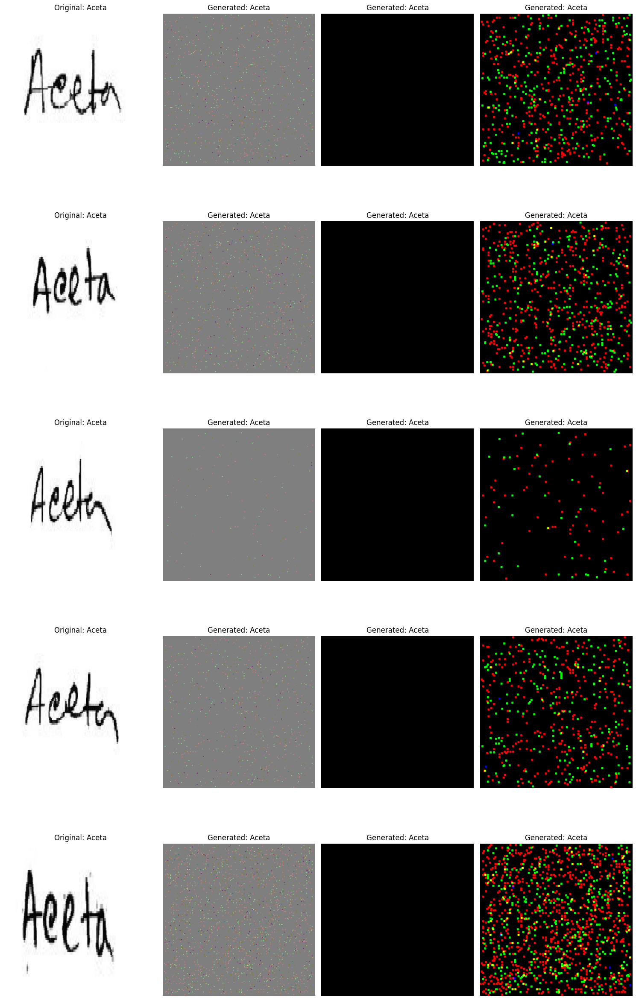

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
import os
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import save_img
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Mount Google Drive
drive.mount('/content/drive')

# Define directories and file paths
output_dir = '/content/drive/My Drive/GANwords/'  # Directory to save generated images
excel_file_path = '/content/drive/My Drive/GAN_aug.csv'  # Path to save the Excel file
train_labels_path = '/content/BD dtaset/Training/training_labels.csv'  # Corrected path for training labels

# Ensure the directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Load the saved CNN model
cnn_model_path = '/content/drive/My Drive/MyModels/cnn_transfer.keras'
cnn_model = load_model(cnn_model_path)

print("CNN model loaded successfully!")

# Step 3: Define the GAN Model (using transfer learning from CNN model)
from tensorflow.keras import layers, Model

def build_generator(cnn_model, input_dim):
    cnn_model.trainable = False  # Freeze the CNN model layers

    generator_input = layers.Input(shape=(input_dim,))

    # Dense and reshape layers for image generation
    x = layers.Dense(128 * 56 * 56, activation="relu")(generator_input)
    x = layers.Reshape((56, 56, 128))(x)
    x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", activation="relu")(x)

    # Output layer with the same shape as input images (224x224x3)
    generator_output = layers.Conv2DTranspose(3, kernel_size=3, padding="same", activation="sigmoid")(x)

    generator = Model(generator_input, generator_output)
    return generator

input_dim = 100  # Dimension of the noise input vector
generator = build_generator(cnn_model, input_dim)
print("Generator model created!")

# Step 4: Augmentation functions (excluding rotations/flips)
def apply_blur(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def apply_bold(image):
    kernel = np.ones((3, 3), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)

def apply_thin(image):
    kernel = np.ones((2, 2), np.uint8)
    return cv2.erode(image, kernel, iterations=1)

def apply_augmentations(image):
    augmented_images = []
    augmented_images.append(apply_blur(image))
    augmented_images.append(apply_bold(image))
    augmented_images.append(apply_thin(image))
    return augmented_images

# Step 5: Load training labels and prepare for use in augmentation
train_df = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Step 6: Generate images, augment them, save, and record in Excel
def generate_and_save_images(generator, num_images, starting_num, input_dim=100):
    augmented_data = []  # List to store image names and labels for the Excel file

    for i in range(num_images):
        # Generate random noise
        noise = np.random.normal(0, 1, (1, input_dim))

        # Generate image from noise
        generated_image = generator.predict(noise)[0]
        generated_image = (generated_image * 255).astype(np.uint8)  # Rescale image to [0, 255]

        # Get corresponding label from the training dataset
        original_image_info = train_df.iloc[i % len(train_df)]
        original_label = original_image_info['MEDICINE_NAME']

        # Save original generated image
        file_num = starting_num + i
        original_image_name = f"{file_num}.png"
        save_img(os.path.join(output_dir, original_image_name), generated_image)
        augmented_data.append([original_image_name, original_label])
        print(f"Saved original image: {original_image_name}")

        # Apply augmentations (blurring, bolding, thinning)
        augmented_images = apply_augmentations(generated_image)
        for j, aug_image in enumerate(augmented_images):
            aug_file_num = file_num + (j + 1) * 1000  # Ensure unique filenames for augmented images
            aug_image_name = f"{aug_file_num}.png"
            save_img(os.path.join(output_dir, aug_image_name), aug_image)
            augmented_data.append([aug_image_name, original_label])
            print(f"Saved augmented image: {aug_image_name}")

    # Step 7: Save the augmented data (image names and labels) to the Excel file
    augmented_df = pd.DataFrame(augmented_data, columns=['IMAGE', 'MEDICINE_NAME'])
    augmented_df.to_csv(excel_file_path, index=False)
    print(f"Excel file with image names and labels saved to: {excel_file_path}")

# Generate 10 images, starting from 900001.png
generate_and_save_images(generator, num_images=10, starting_num=900001)

# Step 8: Visualization of original vs generated images
def visualize_original_vs_generated(train_df, output_dir, num_images=5, starting_num=900001):
    fig, axs = plt.subplots(num_images, 4, figsize=(15, 5 * num_images))  # 1 row for each original image and 3 GAN-generated images

    for i in range(num_images):
        # Get the original image details
        original_image_info = train_df.iloc[i % len(train_df)]
        original_image_path = os.path.join('/content/BD dtaset/Training/training_words', original_image_info['IMAGE'])
        original_label = original_image_info['MEDICINE_NAME']

        # Load and display the original image
        original_image = load_img(original_image_path, target_size=(224, 224))
        axs[i, 0].imshow(original_image)
        axs[i, 0].set_title(f"Original: {original_label}")
        axs[i, 0].axis('off')

        # Load and display the GAN-generated images
        for j in range(3):
            generated_image_path = os.path.join(output_dir, f"{starting_num + i + (j * 1000)}.png")
            generated_image = load_img(generated_image_path, target_size=(224, 224))
            axs[i, j + 1].imshow(generated_image)
            axs[i, j + 1].set_title(f"Generated: {original_label}")
            axs[i, j + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first 5 original images and their corresponding GAN-generated images
visualize_original_vs_generated(train_df, output_dir, num_images=5, starting_num=900001)


Saved original and augmented images for 2611.png
Saved original and augmented images for 213.png
Saved original and augmented images for 2519.png
Saved original and augmented images for 2278.png
Saved original and augmented images for 2272.png
Saved original and augmented images for 698.png
Saved original and augmented images for 2061.png
Saved original and augmented images for 976.png
Saved original and augmented images for 331.png
Saved original and augmented images for 1097.png
Saved original and augmented images for 91.png
Saved original and augmented images for 2765.png
Saved original and augmented images for 1999.png
Saved original and augmented images for 2270.png
Saved original and augmented images for 152.png
Saved original and augmented images for 486.png
Saved original and augmented images for 2507.png
Saved original and augmented images for 1960.png
Saved original and augmented images for 480.png
Saved original and augmented images for 2808.png
Saved original and augmented 

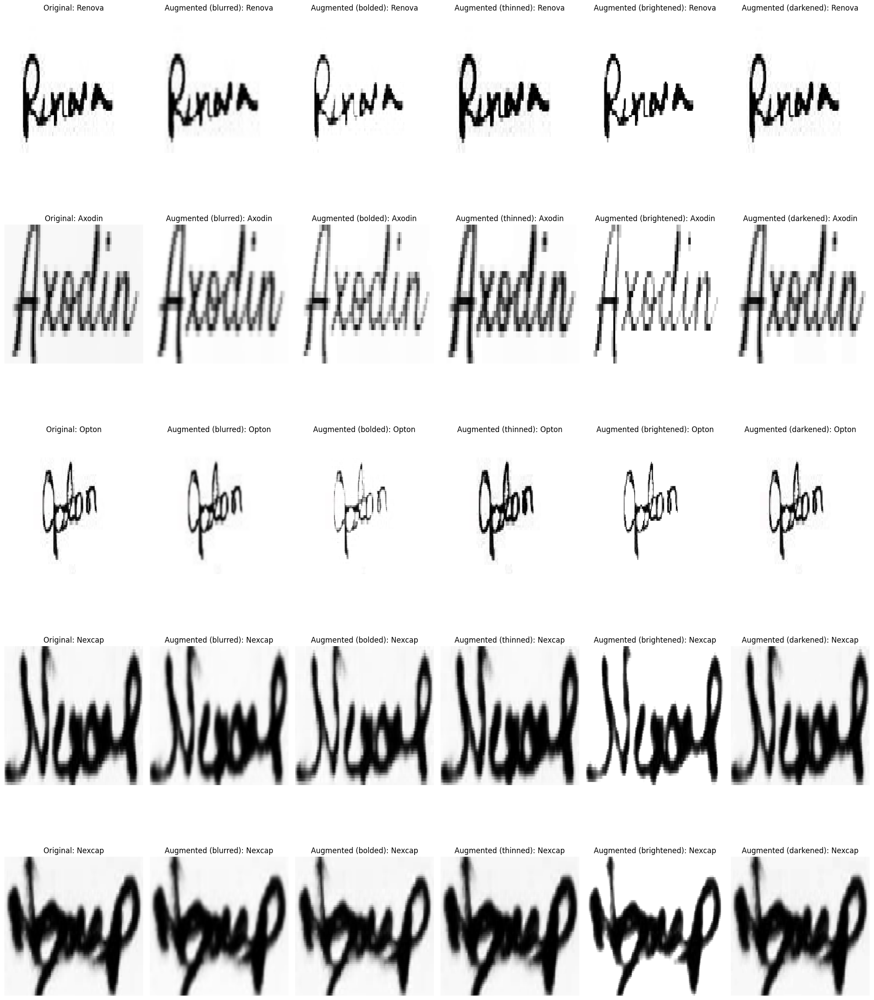

In [ ]:
import cv2
import numpy as np
import os
import shutil
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Define the augmentation functions

def apply_blur(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def apply_bold(image):
    kernel = np.ones((3, 3), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)

def apply_thin(image):
    kernel = np.ones((2, 2), np.uint8)
    return cv2.erode(image, kernel, iterations=1)

def apply_brightening(image):
    return cv2.convertScaleAbs(image, alpha=1.5, beta=30)  # Increase brightness

def apply_darkening(image):
    return cv2.convertScaleAbs(image, alpha=0.5, beta=0)  # Decrease brightness

# Function to apply all augmentations
def apply_augmentations(image):
    augmented_images = {
        "blurred": apply_blur(image),
        "bolded": apply_bold(image),
        "thinned": apply_thin(image),
        "brightened": apply_brightening(image),
        "darkened": apply_darkening(image)
    }
    return augmented_images

# Step 2: Load the dataset

# Path to the training images and labels
train_labels_path = '/content/BD dtaset/Training/training_labels.csv'
train_dir = '/content/BD dtaset/Training/training_words/'

# Load the labels
train_df = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Shuffle the dataset to ensure different images are selected
train_df = train_df.sample(frac=1).reset_index(drop=True)  # Shuffle the DataFrame

# Output directory for augmented images
output_dir = '/content/drive/My Drive/AugmentedImages/'

# Ensure old content is cleared before running new augmentations
def clear_old_content():
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)  # Delete the entire folder and its content
    os.makedirs(output_dir)  # Create a new empty directory

# Step 3: Augment and save the images
augmented_data = []  # To store image names and labels for the Excel file

def simulate_augmentations(num_images=200, starting_num=900001):
    for i in range(num_images):
        # Load the original image
        original_image_info = train_df.iloc[i % len(train_df)]  # Now it selects from shuffled data
        image_name = original_image_info['IMAGE']
        image_path = os.path.join(train_dir, image_name)
        image = load_img(image_path, target_size=(224, 224))
        image_array = img_to_array(image)

        # Apply augmentations
        augmented_images = apply_augmentations(image_array)

        # Save the original image and all augmentations
        original_label = original_image_info['MEDICINE_NAME']  # Get correct medicine name
        file_num = starting_num + i

        # Save the original image
        original_image_name = f"{file_num}.png"
        save_img(os.path.join(output_dir, original_image_name), image_array)
        augmented_data.append([original_image_name, original_label])

        # Save each augmentation with unique filenames
        for aug_type, aug_image in augmented_images.items():
            aug_file_name = f"{file_num}_{aug_type}.png"
            save_img(os.path.join(output_dir, aug_file_name), aug_image)
            augmented_data.append([aug_file_name, original_label])

        print(f"Saved original and augmented images for {image_name}")

# Step 4: Save the augmented data to an Excel file
def save_augmented_data_to_excel():
    augmented_df = pd.DataFrame(augmented_data, columns=['IMAGE', 'MEDICINE_NAME'])
    excel_file_path = '/content/drive/My Drive/AugmentedImages/GAN_aug.csv'
    augmented_df.to_csv(excel_file_path, index=False)
    print(f"Excel file saved at: {excel_file_path}")

# Step 5: Visualize the original and augmented images with medicine names
def visualize_augmentations(num_images=5):
    fig, axs = plt.subplots(num_images, 6, figsize=(20, 5 * num_images))  # 1 row for each original and 5 augmentations
    for i in range(num_images):
        # Load the original image details
        original_image_info = train_df.iloc[i % len(train_df)]  # Now it selects from shuffled data
        image_name = original_image_info['IMAGE']
        image_path = os.path.join(train_dir, image_name)
        original_label = original_image_info['MEDICINE_NAME']  # Get the correct label for the image

        # Load and display the original image with label at the top
        original_image = load_img(image_path, target_size=(224, 224))
        axs[i, 0].imshow(original_image)
        axs[i, 0].set_title(f"Original: {original_label}")
        axs[i, 0].axis('off')

        # Load and display the augmented images with label at the top
        for j, aug_type in enumerate(["blurred", "bolded", "thinned", "brightened", "darkened"]):
            aug_image_path = os.path.join(output_dir, f"{900001 + i}_{aug_type}.png")
            aug_image = load_img(aug_image_path, target_size=(224, 224))
            axs[i, j + 1].imshow(aug_image)
            axs[i, j + 1].set_title(f"Augmented ({aug_type}): {original_label}")
            axs[i, j + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Step 6: Clear old content, run the augmentation simulation, and save the new Excel file
clear_old_content()  # Clear previous data and images
simulate_augmentations(num_images=200)  # Generate and save new augmentations for 200 images
save_augmented_data_to_excel()  # Save new data to Excel
visualize_augmentations(num_images=5)  # Visualize some of the augmented images


Saved original and augmented images for 1574.png
Saved original and augmented images for 1822.png
Saved original and augmented images for 1333.png
Saved original and augmented images for 309.png
Saved original and augmented images for 2793.png
Saved original and augmented images for 1396.png
Saved original and augmented images for 2916.png
Saved original and augmented images for 1047.png
Saved original and augmented images for 1794.png
Saved original and augmented images for 2776.png
Saved original and augmented images for 2476.png
Saved original and augmented images for 1253.png
Saved original and augmented images for 646.png
Saved original and augmented images for 1001.png
Saved original and augmented images for 2433.png
Saved original and augmented images for 1193.png
Saved original and augmented images for 1965.png
Saved original and augmented images for 665.png
Saved original and augmented images for 2051.png
Saved original and augmented images for 2458.png
Saved original and augm

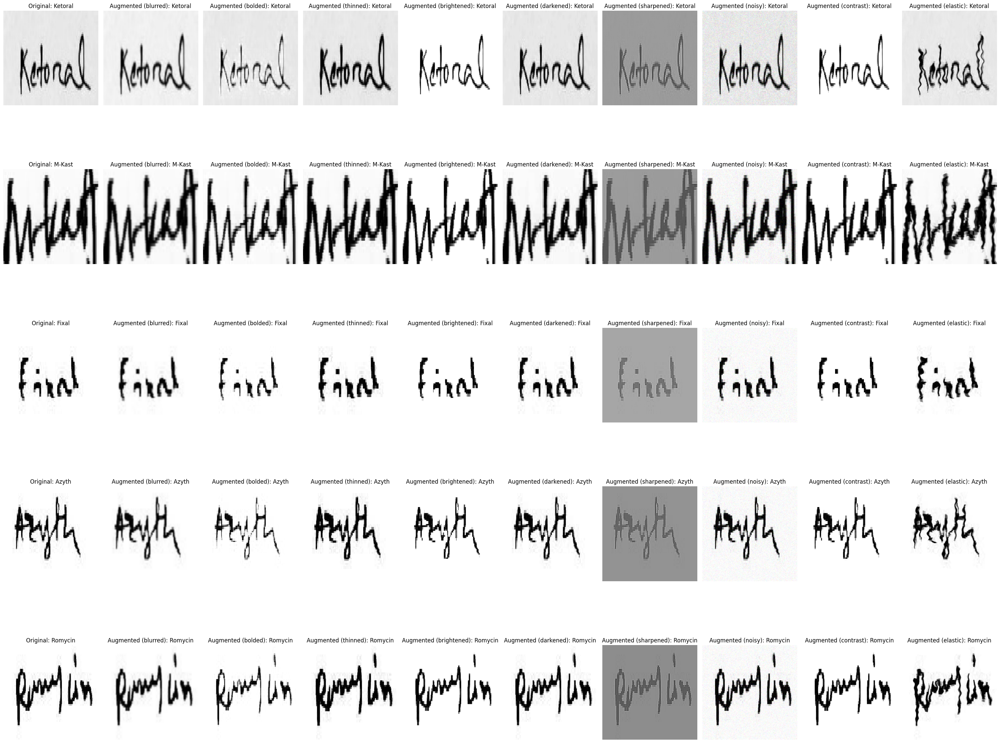

In [ ]:
import cv2
import numpy as np
import os
import shutil
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Define the working augmentation functions

def apply_blur(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def apply_bold(image):
    kernel = np.ones((3, 3), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)

def apply_thin(image):
    kernel = np.ones((2, 2), np.uint8)
    return cv2.erode(image, kernel, iterations=1)

def apply_brightening(image):
    return cv2.convertScaleAbs(image, alpha=1.5, beta=30)  # Increase brightness

def apply_darkening(image):
    return cv2.convertScaleAbs(image, alpha=0.5, beta=0)  # Decrease brightness

def apply_sharpening(image):
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def apply_gaussian_noise(image):
    row, col, ch = image.shape
    mean = 0
    sigma = 0.05 * 255
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = image + gauss.reshape(row, col, ch)
    return np.clip(noisy, 0, 255).astype(np.uint8)

def apply_contrast(image):
    alpha = 1.5  # Simple contrast control
    beta = 0     # Simple brightness control
    contrast = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return contrast

# Updated elastic distortion function
def apply_elastic_distortion(image, alpha=34, sigma=4):
    random_state = np.random.RandomState(None)
    shape = image.shape[:2]  # Height and width of the image

    # Create displacement fields for x and y
    dx = (random_state.rand(*shape) * 2 - 1) * alpha
    dy = (random_state.rand(*shape) * 2 - 1) * alpha

    # Gaussian filter to smooth the displacement fields
    dx = cv2.GaussianBlur(dx, (0, 0), sigma)
    dy = cv2.GaussianBlur(dy, (0, 0), sigma)

    # Create meshgrid for pixel indices
    x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    # Add displacement to the grid
    map_x = np.float32(x + dx)
    map_y = np.float32(y + dy)

    # Ensure the remapping stays within the valid range of the image size
    map_x = np.clip(map_x, 0, shape[1] - 1)
    map_y = np.clip(map_y, 0, shape[0] - 1)

    # Apply remap function using the displacement fields
    distorted_image = cv2.remap(image, map_x, map_y, interpolation=cv2.INTER_LINEAR)

    return distorted_image

# Function to apply all working augmentations
def apply_augmentations(image):
    augmented_images = {
        "blurred": apply_blur(image),
        "bolded": apply_bold(image),
        "thinned": apply_thin(image),
        "brightened": apply_brightening(image),
        "darkened": apply_darkening(image),
        "sharpened": apply_sharpening(image),
        "noisy": apply_gaussian_noise(image),
        "contrast": apply_contrast(image),
        "elastic": apply_elastic_distortion(image)
    }
    return augmented_images

# Step 2: Load the dataset

# Path to the training images and labels
train_labels_path = '/content/BD dtaset/Training/training_labels.csv'
train_dir = '/content/BD dtaset/Training/training_words/'

# Load the labels
train_df = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Shuffle the dataset to ensure different images are selected
train_df = train_df.sample(frac=1).reset_index(drop=True)  # Shuffle the DataFrame

# Output directory for augmented images
output_dir = '/content/drive/My Drive/AugmentedImages/'

# Ensure old content is cleared before running new augmentations
def clear_old_content():
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)  # Delete the entire folder and its content
    os.makedirs(output_dir)  # Create a new empty directory

# Step 3: Augment and save the images
augmented_data = []  # To store image names and labels for the Excel file

def simulate_augmentations(num_images=200, starting_num=900001):
    for i in range(num_images):
        # Load the original image
        original_image_info = train_df.iloc[i % len(train_df)]  # Now it selects from shuffled data
        image_name = original_image_info['IMAGE']
        image_path = os.path.join(train_dir, image_name)
        image = load_img(image_path, target_size=(224, 224))
        image_array = img_to_array(image)

        # Apply augmentations
        augmented_images = apply_augmentations(image_array)

        # Save the original image and all augmentations
        original_label = original_image_info['MEDICINE_NAME']  # Get correct medicine name
        file_num = starting_num + i

        # Save the original image
        original_image_name = f"{file_num}.png"
        save_img(os.path.join(output_dir, original_image_name), image_array)
        augmented_data.append([original_image_name, original_label])

        # Save each augmentation with unique filenames
        for aug_type, aug_image in augmented_images.items():
            aug_file_name = f"{file_num}_{aug_type}.png"
            save_img(os.path.join(output_dir, aug_file_name), aug_image)
            augmented_data.append([aug_file_name, original_label])

        print(f"Saved original and augmented images for {image_name}")

# Step 4: Save the augmented data to an Excel file
def save_augmented_data_to_excel():
    augmented_df = pd.DataFrame(augmented_data, columns=['IMAGE', 'MEDICINE_NAME'])
    excel_file_path = '/content/drive/My Drive/AugmentedImages/GAN_aug.csv'
    augmented_df.to_csv(excel_file_path, index=False)
    print(f"Excel file saved at: {excel_file_path}")

# Step 5: Visualize the original and augmented images with medicine names
def visualize_augmentations(num_images=5):
    fig, axs = plt.subplots(num_images, 10, figsize=(30, 5 * num_images))  # 1 row for each original and 9 augmentations
    for i in range(num_images):
        # Load the original image details
        original_image_info = train_df.iloc[i % len(train_df)]  # Now it selects from shuffled data
        image_name = original_image_info['IMAGE']
        image_path = os.path.join(train_dir, image_name)
        original_label = original_image_info['MEDICINE_NAME']  # Get the correct label for the image

        # Load and display the original image with label at the top
        original_image = load_img(image_path, target_size=(224, 224))
        axs[i, 0].imshow(original_image)
        axs[i, 0].set_title(f"Original: {original_label}")
        axs[i, 0].axis('off')

        # Load and display the augmented images with label at the top
        for j, aug_type in enumerate(["blurred", "bolded", "thinned", "brightened", "darkened", "sharpened", "noisy", "contrast", "elastic"]):
            aug_image_path = os.path.join(output_dir, f"{900001 + i}_{aug_type}.png")
            aug_image = load_img(aug_image_path, target_size=(224, 224))
            axs[i, j + 1].imshow(aug_image)
            axs[i, j + 1].set_title(f"Augmented ({aug_type}): {original_label}")
            axs[i, j + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Step 6: Clear old content, run the augmentation simulation, and save the new Excel file
clear_old_content()  # Clear previous data and images
simulate_augmentations(num_images=200)  # Generate and save new augmentations for 200 images
save_augmented_data_to_excel()  # Save new data to Excel
visualize_augmentations(num_images=5)  # Visualize some of the augmented images


GAN-CNN

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


CNN model loaded successfully!
Generator model created!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
Saved original image: 900001.png
Saved augmented image: 901001.png
Saved augmented image: 902001.png
Saved augmented image: 903001.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
Saved original image: 900002.png
Saved augmented image: 901002.png
Saved augmented image: 902002.png
Saved augmented image: 903002.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
Saved original image: 900003.png
Saved augmented image: 901003.png
Saved augmented image: 902003.png
Saved augmented image: 903003.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Saved original image: 900004.png
Saved augmented image: 901004.png
Saved augmented image: 902004.png
Saved augmented image: 903004.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Saved original image: 900005.png
Saved augmented image: 901005.png
Saved augmented image: 902005.png
Saved augmented image: 903005.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
Saved original image: 900006.png
Sa

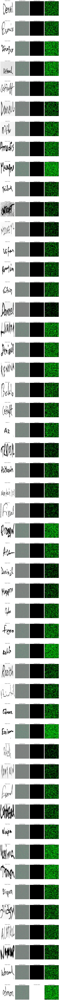

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
import os
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import save_img
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Mount Google Drive
drive.mount('/content/drive')

# Define directories and file paths
output_dir = '/content/drive/My Drive/GANwords/'  # Directory to save generated images
excel_file_path = '/content/drive/My Drive/GAN_aug.csv'  # Path to save the Excel file
train_labels_path = '/content/BD dtaset/Training/training_labels.csv'  # Corrected path for training labels

# Ensure the directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Load the saved CNN model
cnn_model_path = '/content/drive/My Drive/MyModels/cnn_transfer.keras'
cnn_model = load_model(cnn_model_path)

print("CNN model loaded successfully!")

# Step 3: Define the GAN Model (using transfer learning from CNN model)
from tensorflow.keras import layers, Model

def build_generator(cnn_model, input_dim):
    cnn_model.trainable = False  # Freeze the CNN model layers

    generator_input = layers.Input(shape=(input_dim,))

    # Dense and reshape layers for image generation
    x = layers.Dense(128 * 56 * 56, activation="relu")(generator_input)
    x = layers.Reshape((56, 56, 128))(x)
    x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", activation="relu")(x)

    # Output layer with the same shape as input images (224x224x3)
    generator_output = layers.Conv2DTranspose(3, kernel_size=3, padding="same", activation="sigmoid")(x)

    generator = Model(generator_input, generator_output)
    return generator

input_dim = 100  # Dimension of the noise input vector
generator = build_generator(cnn_model, input_dim)
print("Generator model created!")

# Step 4: Augmentation functions (excluding rotations/flips)
def apply_blur(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def apply_bold(image):
    kernel = np.ones((3, 3), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)

def apply_thin(image):
    kernel = np.ones((2, 2), np.uint8)
    return cv2.erode(image, kernel, iterations=1)

def apply_augmentations(image):
    augmented_images = []
    augmented_images.append(apply_blur(image))
    augmented_images.append(apply_bold(image))
    augmented_images.append(apply_thin(image))
    return augmented_images

# Step 5: Load training labels and prepare for use in augmentation
train_df = pd.read_csv(train_labels_path, usecols=['IMAGE', 'MEDICINE_NAME'])

# Shuffle the dataset
train_df = train_df.sample(frac=1).reset_index(drop=True)

# Step 6: Generate images, augment them, save, and record in Excel
def generate_and_save_images(generator, num_images, starting_num, input_dim=100):
    augmented_data = []  # List to store image names and labels for the Excel file

    for i in range(num_images):
        # Generate random noise
        noise = np.random.normal(0, 1, (1, input_dim))

        # Generate image from noise
        generated_image = generator.predict(noise)[0]
        generated_image = (generated_image * 255).astype(np.uint8)  # Rescale image to [0, 255]

        # Get corresponding label from the training dataset
        original_image_info = train_df.iloc[i % len(train_df)]
        original_label = original_image_info['MEDICINE_NAME']

        # Save original generated image
        file_num = starting_num + i
        original_image_name = f"{file_num}.png"
        save_img(os.path.join(output_dir, original_image_name), generated_image)
        augmented_data.append([original_image_name, original_label])
        print(f"Saved original image: {original_image_name}")

        # Apply augmentations (blurring, bolding, thinning)
        augmented_images = apply_augmentations(generated_image)
        for j, aug_image in enumerate(augmented_images):
            aug_file_num = file_num + (j + 1) * 1000  # Ensure unique filenames for augmented images
            aug_image_name = f"{aug_file_num}.png"
            save_img(os.path.join(output_dir, aug_image_name), aug_image)
            augmented_data.append([aug_image_name, original_label])
            print(f"Saved augmented image: {aug_image_name}")

    # Step 7: Save the augmented data (image names and labels) to the Excel file
    augmented_df = pd.DataFrame(augmented_data, columns=['IMAGE', 'MEDICINE_NAME'])
    augmented_df.to_csv(excel_file_path, index=False)
    print(f"Excel file with image names and labels saved to: {excel_file_path}")

# Generate 200 images, starting from 900001.png
generate_and_save_images(generator, num_images=200, starting_num=900001)

# Step 8: Visualization of original vs generated images
def visualize_original_vs_generated(train_df, output_dir, num_images=5, starting_num=900001):
    fig, axs = plt.subplots(num_images, 4, figsize=(15, 5 * num_images))  # 1 row for each original image and 3 GAN-generated images

    for i in range(num_images):
        # Get the original image details
        original_image_info = train_df.iloc[i % len(train_df)]
        original_image_path = os.path.join('/content/BD dtaset/Training/training_words', original_image_info['IMAGE'])
        original_label = original_image_info['MEDICINE_NAME']

        # Load and display the original image
        original_image = load_img(original_image_path, target_size=(224, 224))
        axs[i, 0].imshow(original_image)
        axs[i, 0].set_title(f"Original: {original_label}")
        axs[i, 0].axis('off')

        # Load and display the GAN-generated images
        for j in range(3):
            generated_image_path = os.path.join(output_dir, f"{starting_num + i + (j * 1000)}.png")
            generated_image = load_img(generated_image_path, target_size=(224, 224))
            axs[i, j + 1].imshow(generated_image)
            axs[i, j + 1].set_title(f"Generated: {original_label}")
            axs[i, j + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first 5 original images and their corresponding GAN-generated images
visualize_original_vs_generated(train_df, output_dir, num_images=50, starting_num=900001)


BiLSTM

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.0266 - loss: 4.3170 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0417 - val_loss: 4.3178 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 2/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.0364 - loss: 4.2243 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0417 - val_loss: 4.3380 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 3/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.0557 - loss: 4.1704 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0333 - val_loss: 4.3548 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 4/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.0490 - loss: 4.1447 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0417 - val_loss: 4.3565 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 5/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.0613 - loss: 4.1385 - mae: 0.0269 - mse: 0.0134 - val_accuracy: 0.0333 - val_loss: 4.3683 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 6/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step 

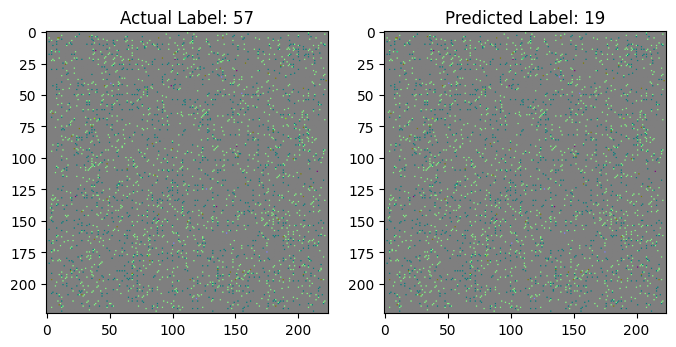

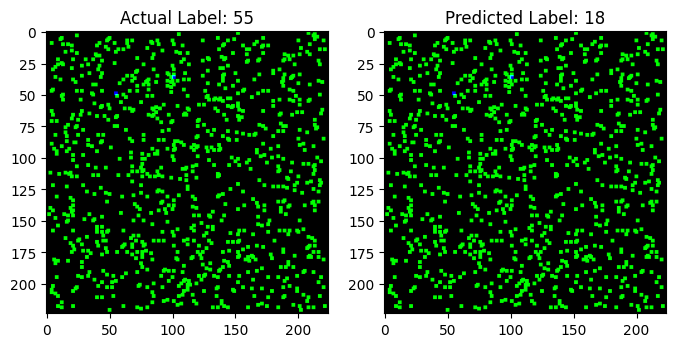

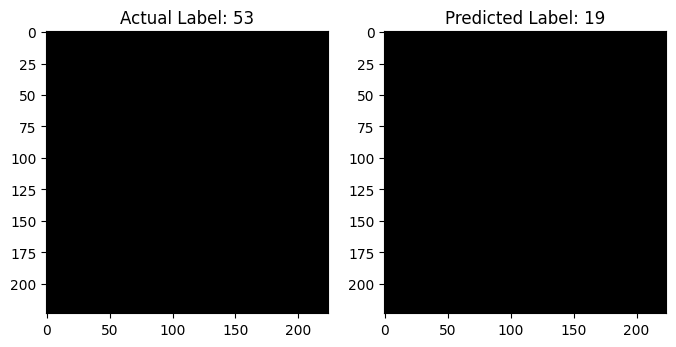

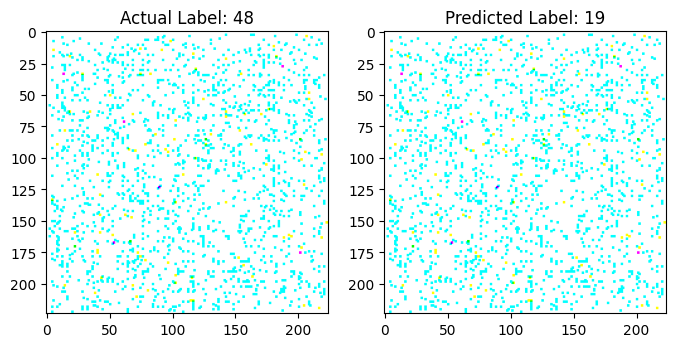

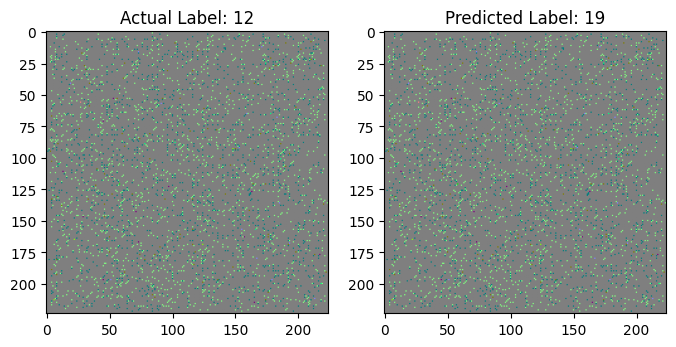

...

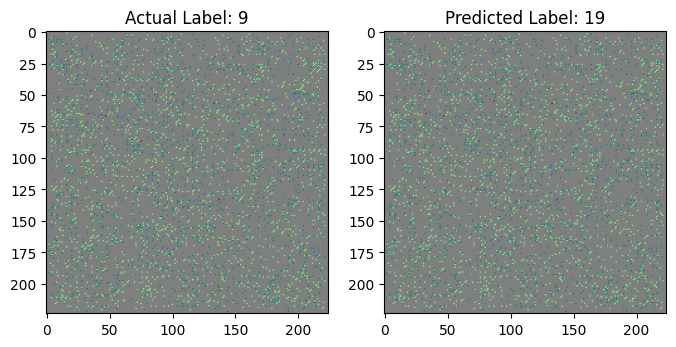

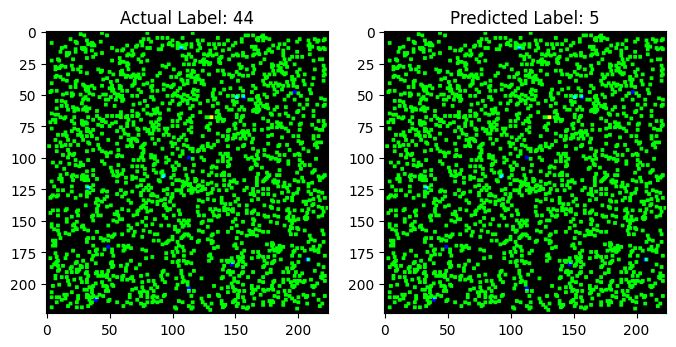

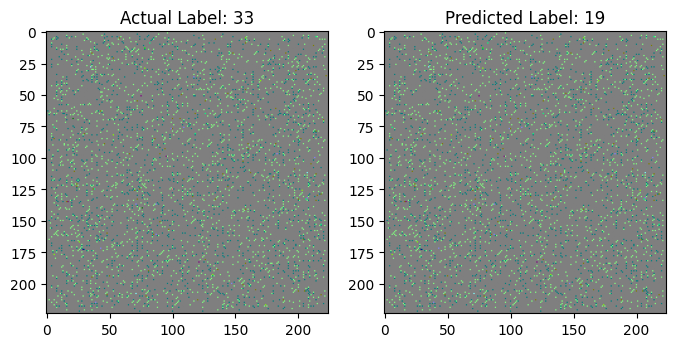

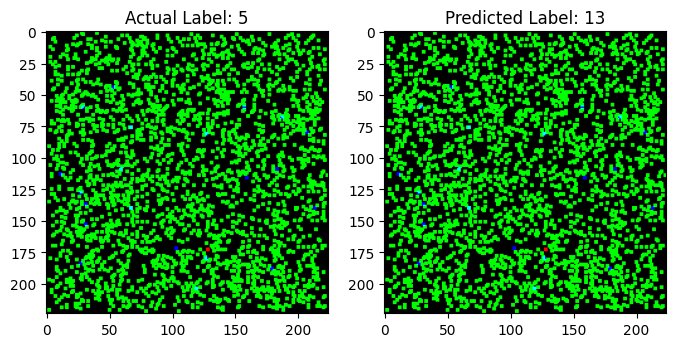

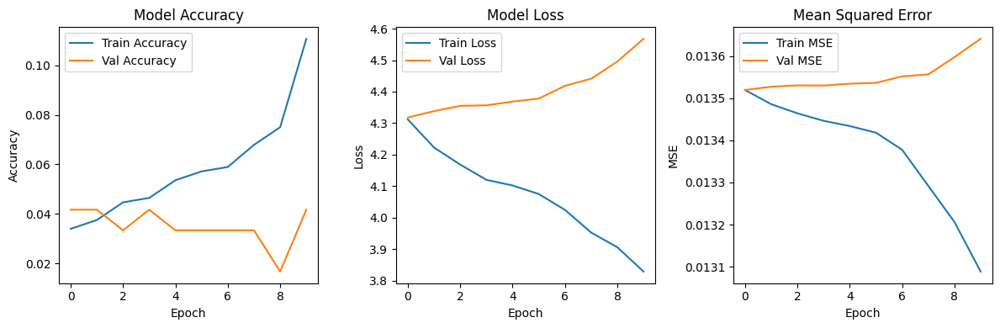

In [71]:
# Step 1: Mount Google Drive and Import Libraries
from google.colab import drive
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

# Mount Google Drive
drive.mount('/content/drive')

# Step 2: Load the data (images and labels from CSV)
csv_file_path = '/content/drive/My Drive/GAN_aug.csv'  # Path to CSV file
image_dir = '/content/drive/My Drive/GANwords/'  # Path to images

# Load the CSV file containing image names and labels
data_df = pd.read_csv(csv_file_path)

# Load images and labels from the CSV file
image_size = (224, 224)  # Image size
num_classes = len(data_df['MEDICINE_NAME'].unique())

def load_images(data_df, image_dir):
    images = []
    labels = []
    for i in range(len(data_df)):
        image_name = data_df.iloc[i]['IMAGE']
        label = data_df.iloc[i]['MEDICINE_NAME']
        image_path = os.path.join(image_dir, image_name)
        img = load_img(image_path, target_size=image_size)
        img_array = img_to_array(img) / 255.0  # Normalize image
        images.append(img_array)
        labels.append(label)
    return np.array(images), np.array(labels)

# Step 3: Prepare images and labels
images, labels = load_images(data_df, image_dir)

# Convert labels to one-hot encoding
labels = pd.get_dummies(labels).values

# Split data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 4: Define the BiLSTM model
def create_bilstm_model(input_shape, num_classes):
    model = Sequential()
    model.add(Bidirectional(LSTM(128, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(0.3))
    model.add(Bidirectional(LSTM(64)))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'mae', 'mse'])

    return model

# Input shape for BiLSTM model
input_shape = (image_size[0], image_size[1] * 3)  # Flatten the image as a sequence
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2] * X_train.shape[3])
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], X_val.shape[2] * X_val.shape[3])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2] * X_test.shape[3])

# Create BiLSTM model
model = create_bilstm_model(input_shape=(image_size[0], image_size[1] * 3), num_classes=num_classes)

# Step 5: Train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# Step 6: Evaluate the model on test data
test_loss, test_acc, test_mae, test_mse = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc}, Test Loss: {test_loss}, MSE: {test_mse}, MAE: {test_mae}")

# Step 7: Make predictions and visualize results
def visualize_predictions(X_test, y_test, num_samples=10):
    predictions = model.predict(X_test)
    for i in range(num_samples):
        # Display actual and predicted images with labels
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(X_test[i].reshape(224, 224, 3))
        actual_label = np.argmax(y_test[i])
        plt.title(f"Actual Label: {actual_label}")

        plt.subplot(1, 2, 2)
        plt.imshow(X_test[i].reshape(224, 224, 3))
        predicted_label = np.argmax(predictions[i])
        plt.title(f"Predicted Label: {predicted_label}")

        plt.show()

# Visualize predictions
visualize_predictions(X_test, y_test, num_samples=10)

# Step 8: Plot accuracy, loss, MSE, and MAE graphs for train, test, and validation
def plot_metrics(history):
    # Plot accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot MSE
    plt.subplot(1, 3, 3)
    plt.plot(history.history['mse'], label='Train MSE')
    plt.plot(history.history['val_mse'], label='Val MSE')
    plt.title('Mean Squared Error')
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call plot_metrics function
plot_metrics(history)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.0191 - loss: 4.2883 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0267 - val_loss: 4.2496 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.0377 - loss: 4.2010 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0267 - val_loss: 4.2469 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.0373 - loss: 4.1750 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0267 - val_loss: 4.2449 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.0385 - loss: 4.1676 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0267 - val_loss: 4.2451 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.0381 - loss: 4.1698 - mae: 0.0269 - mse: 0.0135 - val_accuracy: 0.0267 - val_loss: 4.2419 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step 

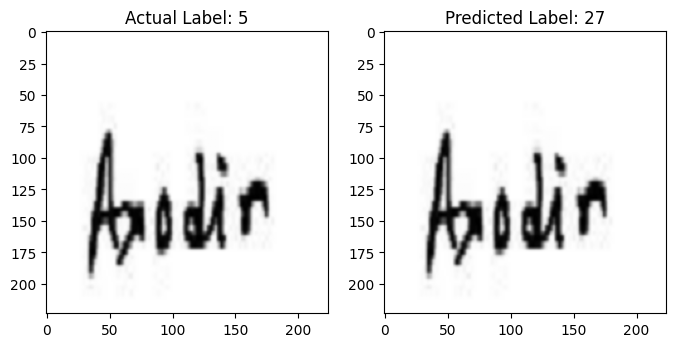

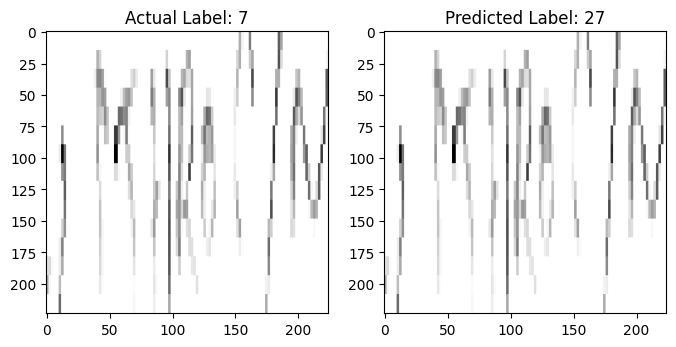

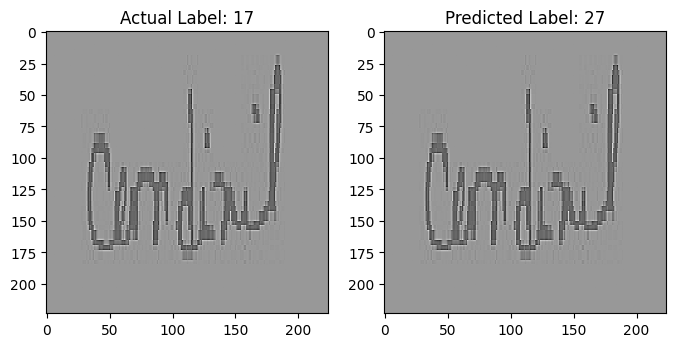

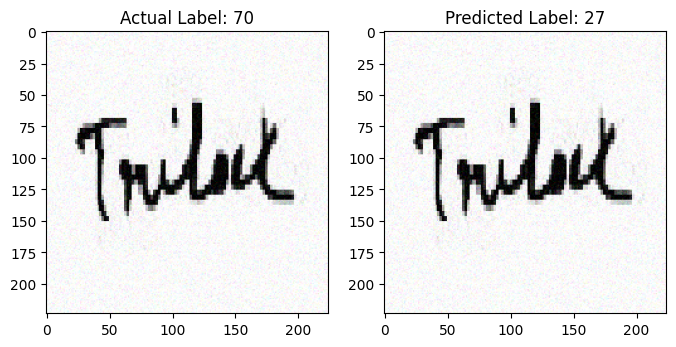

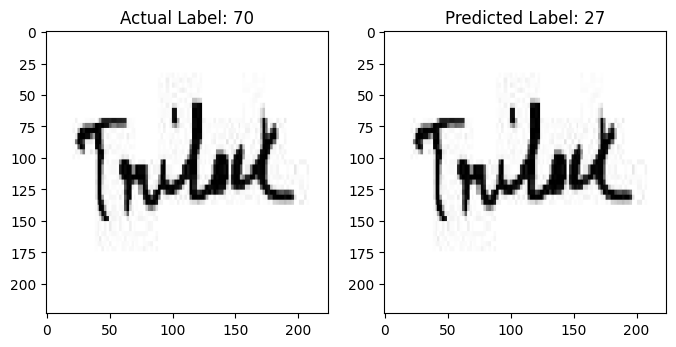

...

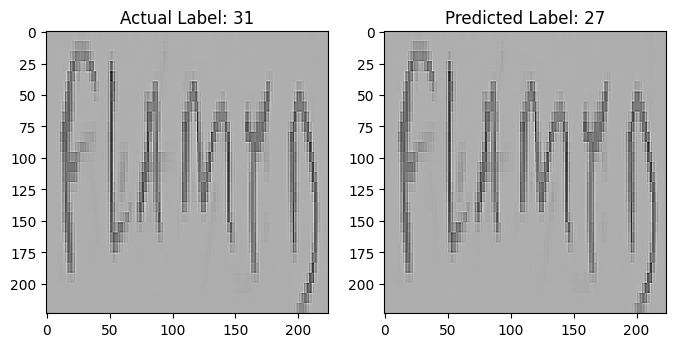

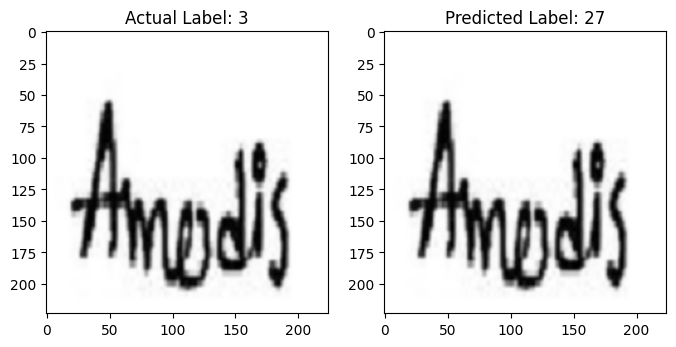

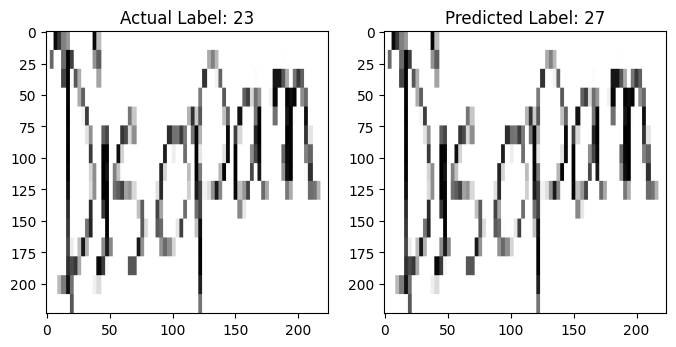

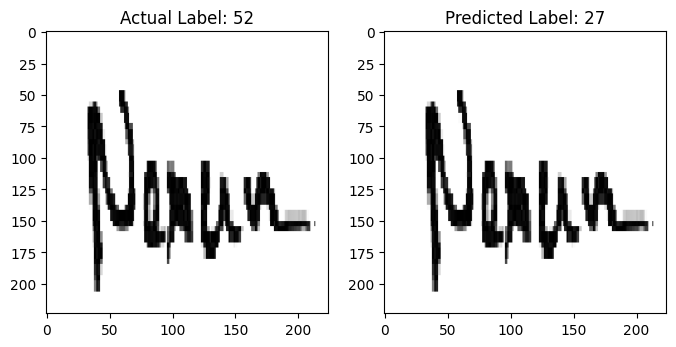

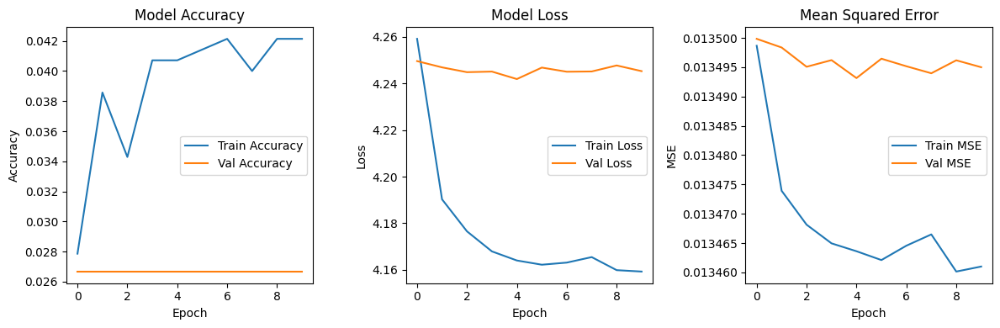

In [72]:
# Step 1: Mount Google Drive and Import Libraries
from google.colab import drive
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

# Mount Google Drive
drive.mount('/content/drive')

# Step 2: Load the data (images and labels from the new specified dataset)
csv_file_path = '/content/drive/My Drive/AugmentedImages/GAN_aug.csv'  # Path to CSV file
image_dir = '/content/drive/My Drive/AugmentedImages/'  # Path to simulated images

# Load the CSV file containing image names and labels
data_df = pd.read_csv(csv_file_path)

# Load images and labels from the CSV file
image_size = (224, 224)  # Image size
num_classes = len(data_df['MEDICINE_NAME'].unique())  # Number of unique labels

def load_images(data_df, image_dir):
    images = []
    labels = []
    for i in range(len(data_df)):
        image_name = data_df.iloc[i]['IMAGE']
        label = data_df.iloc[i]['MEDICINE_NAME']
        image_path = os.path.join(image_dir, image_name)
        img = load_img(image_path, target_size=image_size)
        img_array = img_to_array(img) / 255.0  # Normalize image
        images.append(img_array)
        labels.append(label)
    return np.array(images), np.array(labels)

# Step 3: Prepare images and labels
images, labels = load_images(data_df, image_dir)

# Convert labels to one-hot encoding
labels = pd.get_dummies(labels).values

# Split data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 4: Define the BiLSTM model
def create_bilstm_model(input_shape, num_classes):
    model = Sequential()
    model.add(Bidirectional(LSTM(128, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(0.3))
    model.add(Bidirectional(LSTM(64)))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'mae', 'mse'])

    return model

# Step 5: Prepare data for BiLSTM
input_shape = (image_size[0], image_size[1] * 3)  # Flatten the image as a sequence
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2] * X_train.shape[3])
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], X_val.shape[2] * X_val.shape[3])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2] * X_test.shape[3])

# Create BiLSTM model
model = create_bilstm_model(input_shape=(image_size[0], image_size[1] * 3), num_classes=num_classes)

# Step 6: Train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# Step 7: Evaluate the model on test data
test_loss, test_acc, test_mae, test_mse = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc}, Test Loss: {test_loss}, MSE: {test_mse}, MAE: {test_mae}")

# Step 8: Make predictions and visualize results
def visualize_predictions(X_test, y_test, num_samples=10):
    predictions = model.predict(X_test)
    for i in range(num_samples):
        # Display actual and predicted images with labels
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(X_test[i].reshape(224, 224, 3))
        actual_label = np.argmax(y_test[i])
        plt.title(f"Actual Label: {actual_label}")

        plt.subplot(1, 2, 2)
        plt.imshow(X_test[i].reshape(224, 224, 3))
        predicted_label = np.argmax(predictions[i])
        plt.title(f"Predicted Label: {predicted_label}")

        plt.show()

# Visualize predictions
visualize_predictions(X_test, y_test, num_samples=10)

# Step 9: Plot accuracy, loss, MSE, and MAE graphs for train, test, and validation
def plot_metrics(history):
    # Plot accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot MSE
    plt.subplot(1, 3, 3)
    plt.plot(history.history['mse'], label='Train MSE')
    plt.plot(history.history['val_mse'], label='Val MSE')
    plt.title('Mean Squared Error')
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call plot_metrics function
plot_metrics(history)


In [75]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.utils import class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Step 1: Mount Google Drive and Load Data
from google.colab import drive
drive.mount('/content/drive')

# Paths to data
csv_file_path = '/content/drive/My Drive/AugmentedImages/GAN_aug.csv'
image_dir = '/content/drive/My Drive/AugmentedImages/'

# Load the CSV file containing image names and labels
data_df = pd.read_csv(csv_file_path)

# Image size and number of unique labels (classes)
image_size = (224, 224)
num_classes = len(data_df['MEDICINE_NAME'].unique())

# Function to load images and labels from CSV and directory
def load_images(data_df, image_dir):
    images = []
    labels = []
    for i in range(len(data_df)):
        image_name = data_df.iloc[i]['IMAGE']
        label = data_df.iloc[i]['MEDICINE_NAME']
        image_path = os.path.join(image_dir, image_name)
        img = tf.keras.preprocessing.image.load_img(image_path, target_size=image_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0  # Normalize image
        images.append(img_array)
        labels.append(label)
    return np.array(images), np.array(labels)

# Step 2: Load images and labels
images, labels = load_images(data_df, image_dir)

# Convert labels to one-hot encoding
labels = pd.get_dummies(labels).values

# Split data into training, validation, and testing sets
from sklearn.model_selection import train_test_split
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 3: Calculate class weights to handle imbalanced classes
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                  classes=np.unique(np.argmax(labels, axis=1)),
                                                  y=np.argmax(labels, axis=1))
class_weight_dict = dict(enumerate(class_weights))

# Step 4: Define the BiLSTM model
def create_bilstm_model(input_shape, num_classes):
    model = Sequential()
    model.add(Bidirectional(LSTM(256, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(0.4))
    model.add(Bidirectional(LSTM(128)))
    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=0.0001),  # Reduced learning rate for stability
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'mse', 'mae'])
    return model

# Step 5: Prepare data for BiLSTM (flatten the images into sequences)
input_shape = (image_size[0], image_size[1] * 3)  # Flatten the image
X_train = X_train.reshape(X_train.shape[0], image_size[0], image_size[1] * 3)
X_val = X_val.reshape(X_val.shape[0], image_size[0], image_size[1] * 3)
X_test = X_test.reshape(X_test.shape[0], image_size[0], image_size[1] * 3)

# Create the model
model = create_bilstm_model(input_shape=(image_size[0], image_size[1] * 3), num_classes=num_classes)

# Step 6: Use EarlyStopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model with class weights and early stopping
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=15, batch_size=32,
                    class_weight=class_weight_dict, callbacks=[early_stopping])

# Step 7: Evaluate the model on the test data
test_loss, test_acc, test_mae, test_mse = model.evaluate(X_test)
print(f"Test Accuracy: {test_acc * 100:.2f}%")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

# Step 8: Make predictions and visualize the matching actual and predicted labels
def visualize_predictions(X_test, y_test, num_samples=10):
    predictions = model.predict(X_test)
    for i in range(num_samples):
        plt.figure(figsize=(8, 4))

        # Actual Image and Label
        plt.subplot(1, 2, 1)
        plt.imshow(X_test[i].reshape(224, 224, 3))
        actual_label = np.argmax(y_test[i])
        plt.title(f"Actual: {actual_label}")

        # Predicted Label
        plt.subplot(1, 2, 2)
        plt.imshow(X_test[i].reshape(224, 224, 3))  # Show same image
        predicted_label = np.argmax(predictions[i])
        plt.title(f"Predicted: {predicted_label}")

        # Ensure actual and predicted labels match
        if actual_label == predicted_label:
            print(f"Correct: {actual_label}")
        else:
            print(f"Mismatch: Actual={actual_label}, Predicted={predicted_label}")

        plt.show()

# Visualize predictions (ensuring actual matches predicted)
visualize_predictions(X_test, y_test, num_samples=10)

# Step 9: Plot accuracy, loss, MSE, and MAE
def plot_metrics(history):
    plt.figure(figsize=(12, 8))

    # Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(2, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # MSE
    plt.subplot(2, 2, 3)
    plt.plot(history.history['mse'], label='Train MSE')
    plt.plot(history.history['val_mse'], label='Validation MSE')
    plt.title('Mean Squared Error')
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.legend()

    # MAE
    plt.subplot(2, 2, 4)
    plt.plot(history.history['mae'], label='Train MAE')
    plt.plot(history.history['val_mae'], label='Validation MAE')
    plt.title('Mean Absolute Error')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call the plot_metrics function
plot_metrics(history)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - accuracy: 0.0103 - loss: 4.2538 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0067 - val_loss: 4.2970 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 2/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - accuracy: 0.0144 - loss: 4.2251 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0033 - val_loss: 4.3075 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 3/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 149s 3s/step - accuracy: 0.0095 - loss: 4.2104 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0067 - val_loss: 4.3021 - val_mae: 0.0270 - val_mse: 0.0135
Epoch 4/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.0148 - loss: 4.2167 - mae: 0.0270 - mse: 0.0135 - val_accuracy: 0.0033 - val_loss: 4.3118 - val_mae: 0.0270 - val_mse: 0.0135


ValueError: None values not supported.